# Using trip numbers to estimate charging demand

In [1]:
import os
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from geopy.distance import great_circle
from scipy.spatial import distance

os.chdir('/Users/chengchen/Desktop/Insight/project/')
%matplotlib inline
%config InlineBackend.figure_format = 'svg'


* The dataset below is from Toronto's Transportation Tomorrow Survey 2016. It contains information on number of trips made to 44 different wards in Toronto. For more information on wards, please see https://www.toronto.ca/city-government/data-research-maps/neighbourhoods-communities/ward-profiles/44-ward-model/


In [2]:
df = pd.read_excel('data/raw/tts2016_ward_Toronto.xlsx')
df_trip = df[df.variable.str.contains('Number of trips made to the area as auto driver during ')]
df_trip['time_of_day'] = ['morning', 'afternoon']
df_trip = df_trip.drop('variable', axis = 1).transpose()
df_trip['ward'] = df_trip.index
df_trip.columns = ['morning trips', 'afternoon trips', 'ward']
df_trip.to_excel('data/processed/trip_to_wards.xlsx', index=False)


/Users/chengchen/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [3]:
df_trip.head()

,morning trips,afternoon trips,ward
City of Toronto,639546,639519,City of Toronto
Ward 1,17318,11704,Ward 1
Ward 2,26302,16637,Ward 2
Ward 3,10726,16517,Ward 3
Ward 4,6783,15634,Ward 4


* Merge the number of trips data into wards' shapefile and draw the map to see traffic destinations during AM/PM peak hours.  

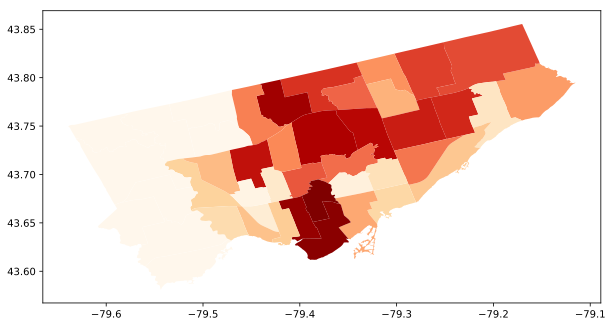

In [4]:
shp_path = 'data/raw/Toronto_wards/icitw_wgs84.shp'
df_ward = gpd.read_file(shp_path)
df_ward['ward'] = 'Ward '+df_ward['SCODE_NAME']
ward_trip_shp = df_ward.merge(df_trip, how='left')
ward_trip_shp.plot(figsize=(10,10), column = 'morning trips',cmap='OrRd')

In [74]:
ward_trip_shp.head()

,GEO_ID,CREATE_ID,NAME,SCODE_NAME,LCODE_NAME,TYPE_DESC,TYPE_CODE,OBJECTID,SHAPE_AREA,SHAPE_LEN,geometry,ward,morning trips,afternoon trips,centroid
0,14630026,63519,Scarborough-Rouge River (41),41,EA41,Ward,CITW,1,0.0,0.0,POLYGON ((-79.26485565927024 43.77955621985134...,Ward 41,18476,16993,POINT (-79.26917462259273 43.80790749648885)
1,14630028,63519,Scarborough East (44),44,EA44,Ward,CITW,2,0.0,0.0,POLYGON ((-79.17076824694337 43.75563765091391...,Ward 44,9919,15938,POINT (-79.16004274473416 43.78602948082036)
2,14630024,63519,Scarborough-Rouge River (42),42,EA42,Ward,CITW,3,0.0,0.0,POLYGON ((-79.22568464642563 43.78940329829909...,Ward 42,18316,17767,POINT (-79.20538746021136 43.82088715366605)
3,14630027,63519,Scarborough-Agincourt (39),39,EA39,Ward,CITW,4,0.0,0.0,POLYGON ((-79.33141527345541 43.79311828976419...,Ward 39,10074,12000,POINT (-79.31244426955141 43.80587904479077)
4,14630035,63519,Willowdale (24),24,NO24,Ward,CITW,5,0.0,0.0,POLYGON ((-79.38719566413288 43.76348086985467...,Ward 24,19504,18917,POINT (-79.37851381383352 43.79238915995334)


In [90]:
ward_trip_shp['centroid'] = ward_trip_shp['geometry'].centroid
ward_AM_trips = ward_trip_shp[['centroid','ward','morning trips']]
ward_AM_trips = gpd.GeoDataFrame(ward_AM_trips, geometry = 'centroid')
ward_AM_trips['long']=ward_AM_trips.centroid.x
ward_AM_trips['lat']=ward_AM_trips.centroid.y
ward_AM_trips.loc[ward_AM_trips['morning trips'].isnull(),'morning trips']=0


In [91]:
def gen_demand(df, EVPR, home_chg_ratio, long_commute_ratio):
    """generate the demand for charging (during day time) for each census tract"""
    pr_ch = long_commute_ratio * 1 + (1-long_commute_ratio)*(1-home_chg_ratio)/5
    # assumptions here: (1) ppl with longer commute (from outside of the city) always need public charging
    #                   (2) ppl with short commute only need public charging (1/5 of the times) if they do not have access to home charging
    df['demand_chg'] = df['morning trips']*EVPR*pr_ch
    return df
EVPR = 0.01
home_chg_ratio = 0.8
long_commute_ratio = 0.1
df_demand = gen_demand(ward_AM_trips, EVPR, home_chg_ratio, long_commute_ratio)
df_demand.head()
df_demand[['ward','morning trips','long','lat','demand_chg']].to_excel('data/cleaned/optimization_ward_demand.xlsx', index = 'ward')

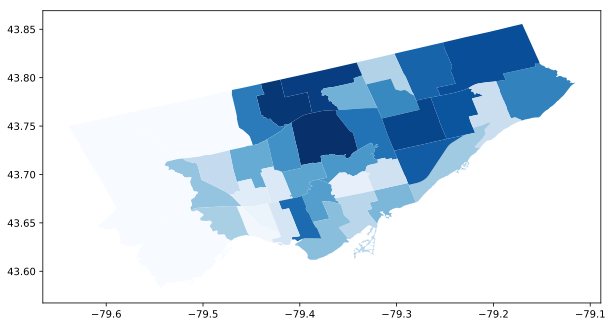

In [5]:
ward_trip_shp.plot(figsize=(10,10), column = 'afternoon trips',cmap='Blues')

* Combine with other information to get more detailed traffic destination information

In [6]:
shp_path2 ='data/raw/Toronto_shp/Toronto_CMA_01_popn_age_sex_marital.shp'
df_TRT_shp = gpd.read_file(shp_path2)

In [7]:
base = df_TRT_shp.plot(figsize=(10,10))
y_lim = ( 43.580438, 43.85) # latitude (boundaries of city of TRT)
x_lim = (-79.659235, -79.128102) # longitude (boundaries of city of TRT)
base.set_xlim(x_lim)
base.set_ylim(y_lim)
ward_trip_shp.plot(ax = base, column = 'morning trips',cmap='OrRd')

* Spatial join

In [8]:
ward_trip_shp.crs = {'init' :'epsg:4326'}
df_TRT_shp.crs == ward_trip_shp.crs

False

In [9]:
df_TRT_shp.shape

(1003, 106)

In [10]:
ward_trip_shp = ward_trip_shp.to_crs(df_TRT_shp.crs)

In [11]:
CT_trips = gpd.sjoin(df_TRT_shp, ward_trip_shp, how="inner", op="intersects")
CT_trips.head()
# each row represents a census tract, the info of "# trips in the ward that this CT belongs to" is added

,CTNAME,GEOGRAPHY,CTUID,CMAUID,PRUID,POP01,POP06,POPCHG,L_AREA,POP06RD,...,SCODE_NAME,LCODE_NAME,TYPE_DESC,TYPE_CODE,OBJECTID,SHAPE_AREA,SHAPE_LEN,ward,morning trips,afternoon trips
0,0001.00,0001.00 (535000100) 010,5350001.00,535,35,626,571,-8.8,6.10,570,...,28,SO28,Ward,CITW,39,0.0,0.0,Ward 28,28180,13146
1,0002.00,0002.00 (535000200) 000,5350002.00,535,35,658,627,-4.7,3.17,625,...,28,SO28,Ward,CITW,39,0.0,0.0,Ward 28,28180,13146
13,0012.00,0012.00 (535001200) 000,5350012.00,535,35,2995,8053,168.9,1.11,8055,...,28,SO28,Ward,CITW,39,0.0,0.0,Ward 28,28180,13146
14,0013.00,0013.00 (535001300) 010,5350013.00,535,35,6365,6315,-0.8,0.76,6315,...,28,SO28,Ward,CITW,39,0.0,0.0,Ward 28,28180,13146
15,0014.00,0014.00 (535001400) 000,5350014.00,535,35,516,548,6.2,0.47,545,...,28,SO28,Ward,CITW,39,0.0,0.0,Ward 28,28180,13146


In [12]:
CT_trips.shape # some CTs might intersect with 

(1046, 120)

* merge dataset with the count of point of interests

In [13]:
shp_path3 = 'data/processed/shape_join_points.shp'
df_TRT_shp3 = gpd.read_file(shp_path3)
df_TRT_shp3.head()

,CTNAME,L_AREA,pop_den,testing,charging s,food court,gas statio,grocery st,parking lo,restaurant,shopping c,university,has_food_c,has chargi,geometry
0,0001.00,6.10,93.606557,647.0,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0,1,1,"POLYGON ((-79.30393646966425 43.6643272879132,..."
1,0002.00,3.17,197.791798,323.0,0.0,1.0,0.0,0.0,5.0,8.0,0.0,0.0,1,0,(POLYGON ((-79.35299366051618 43.6340798358691...
2,0003.00,0.00,0.000000,91.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0,0,POLYGON ((-79.44798780649035 43.63842780120127...
3,0004.00,0.34,20179.411765,34.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,POLYGON ((-79.43598377543616 43.63717191192797...
4,0005.00,0.38,13392.105263,37.0,0.0,0.0,0.0,2.0,1.0,2.0,0.0,0.0,0,0,POLYGON ((-79.42138741235314 43.64066395144786...


In [14]:
CT_trip_pt = df_TRT_shp3.merge(CT_trips, on='CTNAME')

In [15]:
CT_trip_pt.head()
# Each row is a Census Tract, contains info: area, population, population density, 
# number of charging station, food court, gas station, grocery store, parking lot, restaurant, # trips into ward

,CTNAME,L_AREA_x,pop_den,testing,charging s,food court,gas statio,grocery st,parking lo,restaurant,...,SCODE_NAME,LCODE_NAME,TYPE_DESC,TYPE_CODE,OBJECTID,SHAPE_AREA,SHAPE_LEN,ward,morning trips,afternoon trips
0,0001.00,6.10,93.606557,647.0,2.0,1.0,4.0,3.0,6.0,3.0,...,28,SO28,Ward,CITW,39,0.0,0.0,Ward 28,28180,13146
1,0001.00,6.10,93.606557,647.0,2.0,1.0,4.0,3.0,6.0,3.0,...,30,SO30,Ward,CITW,33,0.0,0.0,Ward 30,9595,11853
2,0001.00,6.10,93.606557,647.0,2.0,1.0,4.0,3.0,6.0,3.0,...,32,SO32,Ward,CITW,29,0.0,0.0,Ward 32,6652,13474
3,0002.00,3.17,197.791798,323.0,0.0,1.0,0.0,0.0,5.0,8.0,...,28,SO28,Ward,CITW,39,0.0,0.0,Ward 28,28180,13146
4,0003.00,0.00,0.000000,91.0,0.0,0.0,0.0,0.0,6.0,0.0,...,05,WE05,Ward,CITW,43,0.0,0.0,Ward 05,NaN,NaN


In [16]:
CT_trip_pt.shape

(969, 134)

In [17]:
CT_trip_pt.groupby(['ward']).size()


ward
Ward 01    22
Ward 02    32
Ward 03    20
Ward 04    25
Ward 05    25
Ward 06    21
Ward 07    22
Ward 08    21
Ward 09    19
Ward 10    18
Ward 11    24
Ward 12    28
Ward 13    24
Ward 14    21
Ward 15    24
Ward 16    21
Ward 17    23
Ward 18    21
Ward 19    22
Ward 20    24
Ward 21    23
Ward 22    28
Ward 23    19
Ward 24    19
Ward 25    25
Ward 26    26
Ward 27    30
Ward 28    23
Ward 29    20
Ward 30    26
Ward 31    21
Ward 32    21
Ward 33    16
Ward 34    26
Ward 35    30
Ward 36    23
Ward 37    31
Ward 38    26
Ward 39     7
Ward 40    22
Ward 41     7
Ward 42     3
Ward 43    24
Ward 44    16
dtype: int64

In [18]:
CT_trip_pt.columns

Index(['CTNAME', 'L_AREA_x', 'pop_den', 'testing', 'charging s', 'food court',
       'gas statio', 'grocery st', 'parking lo', 'restaurant',
       ...
       'SCODE_NAME', 'LCODE_NAME', 'TYPE_DESC', 'TYPE_CODE', 'OBJECTID',
       'SHAPE_AREA', 'SHAPE_LEN', 'ward', 'morning trips', 'afternoon trips'],
      dtype='object', length=134)

In [19]:
select_column = ['CTNAME', 'L_AREA_x', 'POP06', 'pop_den', 'charging s', 
                 'food court', 'gas statio', 'grocery st', 'parking lo', 
                 'restaurant', 'university','shopping c','has_food_c',
                 'geometry_x', 'ward', 'morning trips', 'afternoon trips']

* cleaning the dataset and keep only desirable variables

In [20]:
CT_trip_pt2 = CT_trip_pt[select_column]
CT_trip_pt2.loc[CT_trip_pt2['morning trips'].isnull(),'morning trips'] = 0
CT_trip_pt2.loc[CT_trip_pt2['afternoon trips'].isnull(),'afternoon trips'] = 0
CT_trip_pt2.columns = ['CTname', 'l_area', 'pop', 'pop_den', 'chg_stn', 'food_court',
                      'gas_station', 'grocery', 'parking lot', 'restaurant',
                      'university', 'shopping', 'dummy_foodc', 'geometry','ward','AM_trips','PM_trips']
CT_trip_pt2.head()

/Users/chengchen/anaconda/lib/python3.6/site-packages/pandas/core/indexing.py:477: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


,CTname,l_area,pop,pop_den,chg_stn,food_court,gas_station,grocery,parking lot,restaurant,university,shopping,dummy_foodc,geometry,ward,AM_trips,PM_trips
0,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0,1,"POLYGON ((-79.30393646966425 43.6643272879132,...",Ward 28,28180,13146
1,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0,1,"POLYGON ((-79.30393646966425 43.6643272879132,...",Ward 30,9595,11853
2,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0,1,"POLYGON ((-79.30393646966425 43.6643272879132,...",Ward 32,6652,13474
3,0002.00,3.17,627,197.791798,0.0,1.0,0.0,0.0,5.0,8.0,0.0,0.0,1,(POLYGON ((-79.35299366051618 43.6340798358691...,Ward 28,28180,13146
4,0003.00,0.00,0,0.000000,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0,POLYGON ((-79.44798780649035 43.63842780120127...,Ward 05,0,0


In [21]:
gdf_CT_trip_pt = gpd.GeoDataFrame(CT_trip_pt2, geometry = 'geometry')

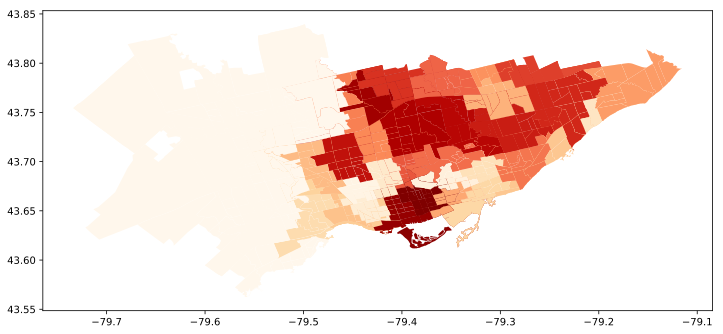

In [22]:
gdf_CT_trip_pt.plot(figsize=(12,10),column='AM_trips',cmap='OrRd')

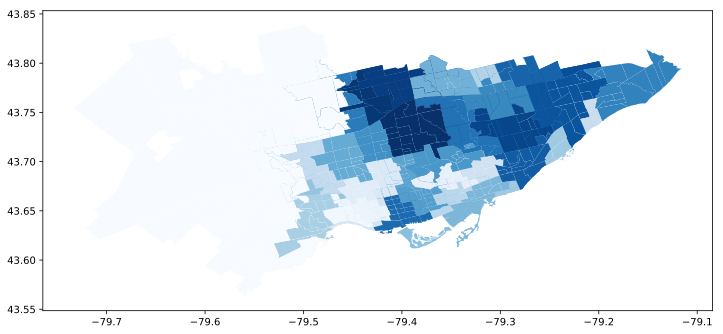

In [23]:
gdf_CT_trip_pt.plot(figsize=(12,10),column='PM_trips',cmap='Blues')

* For each Census Tract within a ward, create a proxy for "popularity of the CT" 
* For AM trips, use # food courts/restaurants/... (places to do day time activities)
* For PM trips, use population density  (trips to home)

In [24]:
gdf_CT_trip_pt.head()

,CTname,l_area,pop,pop_den,chg_stn,food_court,gas_station,grocery,parking lot,restaurant,university,shopping,dummy_foodc,geometry,ward,AM_trips,PM_trips
0,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0,1,"POLYGON ((-79.30393646966425 43.6643272879132,...",Ward 28,28180,13146
1,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0,1,"POLYGON ((-79.30393646966425 43.6643272879132,...",Ward 30,9595,11853
2,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0,1,"POLYGON ((-79.30393646966425 43.6643272879132,...",Ward 32,6652,13474
3,0002.00,3.17,627,197.791798,0.0,1.0,0.0,0.0,5.0,8.0,0.0,0.0,1,(POLYGON ((-79.35299366051618 43.6340798358691...,Ward 28,28180,13146
4,0003.00,0.00,0,0.000000,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0,POLYGON ((-79.44798780649035 43.63842780120127...,Ward 05,0,0


In [25]:
gdf_CT_trip_pt.shape

(969, 17)

In [26]:
# if a CT is spanned over several wards, treat them with equal weights of those wards
gdf_CT_trip_pt['CT_ward_count'] = gdf_CT_trip_pt.groupby(['CTname'])['CTname'].transform('size')
gdf_CT_trip_pt['CT_ward_weight'] = 1/gdf_CT_trip_pt['CT_ward_count']

In [27]:
# calculate the number of point features for each ward
desired_feature = ['pop_den', 'food_court', 'gas_station', 'grocery', 'parking lot', 'restaurant', 'shopping']
def count_ward_point(df, feature):
    df['weighted_'+feature] = df[feature]*df['CT_ward_weight']
    df['sum_ward_'+feature] = df['weighted_'+feature].groupby(df['ward']).transform('sum')
    return df
for feature in desired_feature:
    gdf_CT_trip_pt = count_ward_point(gdf_CT_trip_pt, feature)
gdf_CT_trip_pt.head()

,CTname,l_area,pop,pop_den,chg_stn,food_court,gas_station,grocery,parking lot,restaurant,...,weighted_gas_station,sum_ward_gas_station,weighted_grocery,sum_ward_grocery,weighted_parking lot,sum_ward_parking lot,weighted_restaurant,sum_ward_restaurant,weighted_shopping,sum_ward_shopping
0,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,1.333333,6.583333,1.0,28.250000,2.0,58.000000,1.0,54.083333,0.0,9.833333
1,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,1.333333,5.750000,1.0,19.750000,2.0,30.416667,1.0,49.333333,0.0,3.833333
2,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,1.333333,5.333333,1.0,24.166667,2.0,29.916667,1.0,45.916667,0.0,0.833333
3,0002.00,3.17,627,197.791798,0.0,1.0,0.0,0.0,5.0,8.0,...,0.000000,6.583333,0.0,28.250000,5.0,58.000000,8.0,54.083333,0.0,9.833333
4,0003.00,0.00,0,0.000000,0.0,0.0,0.0,0.0,6.0,0.0,...,0.000000,12.916667,0.0,23.916667,1.2,32.366667,0.0,68.583333,0.0,9.750000


In [28]:
day_activity_feature = ['food_court', 'gas_station', 'grocery', 'parking lot', 'restaurant', 'shopping']
gdf_CT_trip_pt['CT_day_act_score'] = 0
for feature in day_activity_feature:
    gdf_CT_trip_pt['CT_day_act_score'] += (gdf_CT_trip_pt['weighted_'+feature]/gdf_CT_trip_pt['sum_ward_'+feature])
gdf_CT_trip_pt['CT_day_act_score']/=len(day_activity_feature)                                           
                                        

In [29]:
gdf_CT_trip_pt.head()

,CTname,l_area,pop,pop_den,chg_stn,food_court,gas_station,grocery,parking lot,restaurant,...,sum_ward_gas_station,weighted_grocery,sum_ward_grocery,weighted_parking lot,sum_ward_parking lot,weighted_restaurant,sum_ward_restaurant,weighted_shopping,sum_ward_shopping,CT_day_act_score
0,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,6.583333,1.0,28.250000,2.0,58.000000,1.0,54.083333,0.0,9.833333,0.050971
1,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,5.750000,1.0,19.750000,2.0,30.416667,1.0,49.333333,0.0,3.833333,0.077296
2,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,5.333333,1.0,24.166667,2.0,29.916667,1.0,45.916667,0.0,0.833333,0.093638
3,0002.00,3.17,627,197.791798,0.0,1.0,0.0,0.0,5.0,8.0,...,6.583333,0.0,28.250000,5.0,58.000000,8.0,54.083333,0.0,9.833333,0.046484
4,0003.00,0.00,0,0.000000,0.0,0.0,0.0,0.0,6.0,0.0,...,12.916667,0.0,23.916667,1.2,32.366667,0.0,68.583333,0.0,9.750000,0.006179


In [30]:
gdf_CT_trip_pt['CT_day_act_score'].groupby(gdf_CT_trip_pt['ward']).transform('sum').describe()
# After this transformation, the day_activity_score sums to 1 for each ward
# Divide the number of morning trips to each census tract based on their day_activity_score

count    9.390000e+02
mean     1.000000e+00
std      1.589225e-16
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name: CT_day_act_score, dtype: float64

In [31]:
gdf_CT_trip_pt['CT_AM_trips'] = gdf_CT_trip_pt['CT_day_act_score']*gdf_CT_trip_pt['AM_trips']
gdf_CT_trip_pt[['CT_AM_trips','CT_day_act_score','AM_trips']].head()

,CT_AM_trips,CT_day_act_score,AM_trips
0,1436.37,0.050971,28180
1,741.66,0.077296,9595
2,622.88,0.093638,6652
3,1309.91,0.046484,28180
4,0,0.006179,0


In [32]:
gdf_CT_trip_pt['CT_sum_AM_trips'] = gdf_CT_trip_pt['CT_AM_trips'].groupby(gdf_CT_trip_pt['CTname']).transform('sum')
gdf_CT_trip_pt.head()

,CTname,l_area,pop,pop_den,chg_stn,food_court,gas_station,grocery,parking lot,restaurant,...,sum_ward_grocery,weighted_parking lot,sum_ward_parking lot,weighted_restaurant,sum_ward_restaurant,weighted_shopping,sum_ward_shopping,CT_day_act_score,CT_AM_trips,CT_sum_AM_trips
0,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,28.250000,2.0,58.000000,1.0,54.083333,0.0,9.833333,0.050971,1436.37,2800.912137
1,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,19.750000,2.0,30.416667,1.0,49.333333,0.0,3.833333,0.077296,741.66,2800.912137
2,0001.00,6.10,571,93.606557,2.0,1.0,4.0,3.0,6.0,3.0,...,24.166667,2.0,29.916667,1.0,45.916667,0.0,0.833333,0.093638,622.88,2800.912137
3,0002.00,3.17,627,197.791798,0.0,1.0,0.0,0.0,5.0,8.0,...,28.250000,5.0,58.000000,8.0,54.083333,0.0,9.833333,0.046484,1309.91,1309.913919
4,0003.00,0.00,0,0.000000,0.0,0.0,0.0,0.0,6.0,0.0,...,23.916667,1.2,32.366667,0.0,68.583333,0.0,9.750000,0.006179,0,184.679146


In [33]:
# FUTURE WORK: for PM trips, do the same with pop_den
# collapse the above dataset to drop duplicated CTs, and get CT centroid coords
desired_columns = ['CTname','geometry','CT_sum_AM_trips']

In [34]:
CT_AM_trips = gdf_CT_trip_pt[desired_columns]

In [35]:
CT_AM_trips.drop_duplicates(subset = 'CTname')

,CTname,geometry,CT_sum_AM_trips
0,0001.00,"POLYGON ((-79.30393646966425 43.6643272879132,...",2800.912137
3,0002.00,(POLYGON ((-79.35299366051618 43.6340798358691...,1309.913919
4,0003.00,POLYGON ((-79.44798780649035 43.63842780120127...,184.679146
9,0004.00,POLYGON ((-79.43598377543616 43.63717191192797...,134.189408
10,0005.00,POLYGON ((-79.42138741235314 43.64066395144786...,292.891861
13,0006.00,POLYGON ((-79.43236916323818 43.63550227978146...,0.000000
14,0007.01,POLYGON ((-79.42887844558049 43.63345175103496...,0.000000
15,0007.02,POLYGON ((-79.42887844558049 43.63345175103496...,250.126531
17,0008.00,POLYGON ((-79.39653904644052 43.63413799780656...,3950.139725
20,0009.00,"POLYGON ((-79.42174735943988 43.6435965628559,...",52.385496


/Users/chengchen/anaconda/lib/python3.6/site-packages/matplotlib/colors.py:494: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


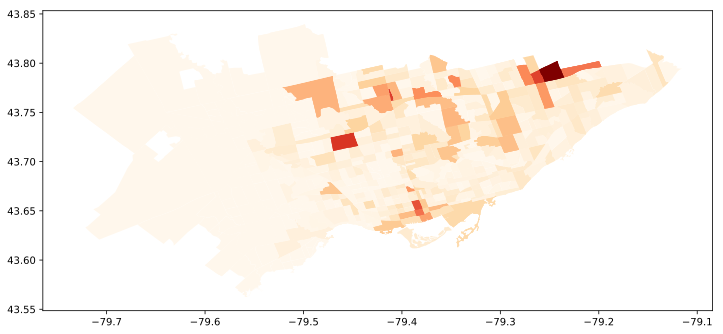

In [36]:
CT_AM_trips.plot(figsize=(12,10),column='CT_sum_AM_trips',cmap='OrRd')

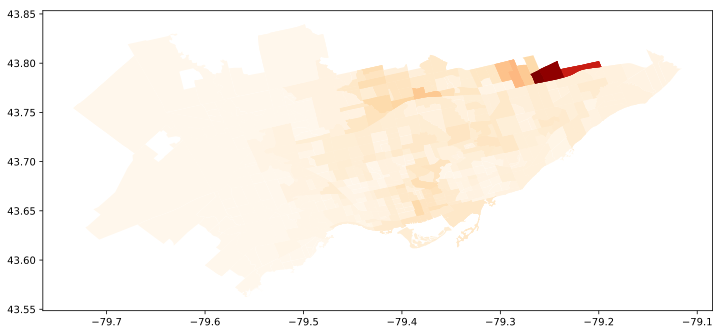

In [37]:
# The above map looks suspecious... Does my day_activity_score really work? 
# try another simpler approach for now: calculate the trips to each CT as # trips to ward/# CTs in ward
gdf_CT_trip_pt2 = gpd.GeoDataFrame(CT_trip_pt2, geometry = 'geometry')
# if a CT is spanned over several wards, treat them with equal weights of those wards
gdf_CT_trip_pt2['CT_ward_count'] = gdf_CT_trip_pt2.groupby(['CTname'])['CTname'].transform('size')
gdf_CT_trip_pt2['CT_ward_weight'] = 1/gdf_CT_trip_pt2['CT_ward_count']
gdf_CT_trip_pt2['ward_count_weighted']=gdf_CT_trip_pt2['CT_ward_weight'].groupby(gdf_CT_trip_pt2['ward']).transform('sum')
gdf_CT_trip_pt2['CT_avg_AM_trips'] = gdf_CT_trip_pt2['AM_trips']/gdf_CT_trip_pt2['ward_count_weighted']
gdf_CT_trip_pt2['CT_AM_trips'] = gdf_CT_trip_pt2['CT_avg_AM_trips'].groupby(gdf_CT_trip_pt2['CTname']).transform('sum')
gdf_CT_trip_pt2.plot(figsize=(12,10),column='CT_AM_trips',cmap='OrRd')

In [38]:
desired_columns = ['CTname','geometry','CT_AM_trips']
CT_AM_trips2 = gdf_CT_trip_pt2[desired_columns]
CT_AM_trips2 = CT_AM_trips2.drop_duplicates(subset = 'CTname')
CT_AM_trips2 = CT_AM_trips2.reset_index()
CT_AM_trips2['id']=CT_AM_trips2.index
CT_AM_trips2.head()

,index,CTname,geometry,CT_AM_trips,id
0,0,0001.00,"POLYGON ((-79.30393646966425 43.6643272879132,...",3855.182513,0
1,3,0002.00,(POLYGON ((-79.35299366051618 43.6340798358691...,2581.374046,1
2,4,0003.00,POLYGON ((-79.44798780649035 43.63842780120127...,1988.485688,2
3,9,0004.00,POLYGON ((-79.43598377543616 43.63717191192797...,714.248927,3
4,10,0005.00,POLYGON ((-79.42138741235314 43.64066395144786...,1967.154212,4


In [39]:
CT_AM_trips2.shape

(510, 5)

In [40]:
# Next, find the centroid coords of each CT (510 points in total)
CT_AM_trips2['centroid'] = CT_AM_trips2['geometry'].centroid
CT_traffic = CT_AM_trips2[['CTname','CT_AM_trips','centroid','id']]

In [41]:
CT_traffic = gpd.GeoDataFrame(CT_traffic, geometry = 'centroid')


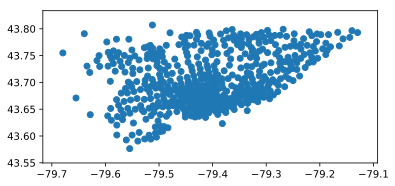

In [42]:
CT_traffic.plot()

In [43]:
CT_traffic.head()

,CTname,CT_AM_trips,centroid,id
0,0001.00,3855.182513,POINT (-79.33539658094128 43.64724199441761),0
1,0002.00,2581.374046,POINT (-79.38185864100119 43.62312488364434),1
2,0003.00,1988.485688,POINT (-79.4510400519881 43.63533134789355),2
3,0004.00,714.248927,POINT (-79.43976657841749 43.63745953287813),3
4,0005.00,1967.154212,POINT (-79.43048691478269 43.63990748114536),4


In [44]:
CT_traffic['long']=CT_traffic.centroid.x
CT_traffic['lat']=CT_traffic.centroid.y
CT_traffic.head()


,CTname,CT_AM_trips,centroid,id,long,lat
0,0001.00,3855.182513,POINT (-79.33539658094128 43.64724199441761),0,-79.335397,43.647242
1,0002.00,2581.374046,POINT (-79.38185864100119 43.62312488364434),1,-79.381859,43.623125
2,0003.00,1988.485688,POINT (-79.4510400519881 43.63533134789355),2,-79.451040,43.635331
3,0004.00,714.248927,POINT (-79.43976657841749 43.63745953287813),3,-79.439767,43.637460
4,0005.00,1967.154212,POINT (-79.43048691478269 43.63990748114536),4,-79.430487,43.639907


In [97]:
df_parking3 = df_parking[df_parking['Rating']>4.5]

/Users/chengchen/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/chengchen/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


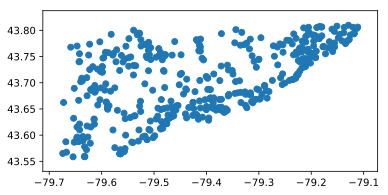

In [98]:
df_parking = pd.read_excel('data/raw/TRT_parking.xlsx')   # len=1417
df_parking_2 = df_parking[df_parking['Rating']>4]  # len=428
# reducing complexity here and only choose the highly-rated parking lots as candidates for EV charger location
def df_to_gdf(df):
    """takes a dataframe with columns named 'longitude' and 'latitude' 
    to transform to a geodataframe with point features"""
    
    df['coordinates'] = df[['longitude', 'latitude']].values.tolist()
    df['coordinates'] = df['coordinates'].apply(Point)
    df = gpd.GeoDataFrame(df, geometry = 'coordinates')
    return df
gdf_parking = df_to_gdf(df_parking_2)
gdf_parking_high_rt = df_to_gdf(df_parking3)
gdf_parking.plot()

In [100]:
gdf_parking = gdf_parking.reset_index()
gdf_parking['chg_id']=gdf_parking.index
gdf_parking['name']='pk'
gdf_parking_high_rt = gdf_parking_high_rt.reset_index()
gdf_parking_high_rt['chg_id']=gdf_parking_high_rt.index
gdf_parking_high_rt['name']='pk'

gdf_parking_high_rt.head()

,index,ID,Name,latitude,longitude,Rating,Url,coordinates,chg_id,name
0,11,ChIJuTemeFFHK4gRs1k0r0jiN7Y,Parking (Cooksville Temporary Parking),43.584487,-79.621720,5.0,https://maps.google.com/?cid=13130212040426936755,POINT (-79.62172029999999 43.5844871),0,pk
1,13,ChIJn0Plt7xGK4gRxm8yC8yivb8,Huron Park Recreation Centre,43.558794,-79.632004,5.0,https://maps.google.com/?cid=13816378229087432646,POINT (-79.63200399999999 43.55879400000001),1,pk
2,14,ChIJM3gtabtHK4gRRNuNghJpbVg,Khaira Park,43.590497,-79.635780,5.0,https://maps.google.com/?cid=6371864576019782468,POINT (-79.63578 43.5904973),2,pk
3,15,ChIJeW3TKb5BK4gRMKH893B20EA,Public Parking for Sandford Farm Park,43.587332,-79.668327,5.0,https://maps.google.com/?cid=4670363041152147760,POINT (-79.66832699999999 43.5873324),3,pk
4,42,ChIJtRBAniZHK4gRuRrOI99I-Dw,Zipcar,43.591725,-79.635031,5.0,https://maps.google.com/?cid=4393341559715535545,POINT (-79.6350312 43.5917253),4,pk


In [101]:
gdf_parking['id']=gdf_parking['name'].str.cat(gdf_parking['chg_id'].astype(str)) 
gdf_parking.head()
gdf_parking_high_rt['id']=gdf_parking_high_rt['name'].str.cat(gdf_parking_high_rt['chg_id'].astype(str)) 


* Get the great circle distance matrix between charging demand points and potential locations for charging stations

In [48]:
# dictify a dataframe: https://stackoverflow.com/questions/19798112/convert-pandas-dataframe-to-a-nested-dict


In [102]:
coords_pk = [(x,y) for x,y in zip(gdf_parking['longitude'],gdf_parking['latitude'])]
coords_trip = [(x,y) for x,y in zip(CT_traffic['long'],CT_traffic['lat'])]
coords_ward_trip = [(x,y) for x,y in zip(df_demand['long'],df_demand['lat'])]
coords_pk_hr = [(x,y) for x,y in zip(gdf_parking_high_rt['longitude'],gdf_parking_high_rt['latitude'])]

distance_matrix = distance.cdist(coords_pk, coords_trip, 'euclidean')
distance_matrix_subsample = distance.cdist(coords_pk_hr, coords_ward_trip, 'euclidean')

In [50]:
distance_matrix.shape
# each row: parking lots
# each column: centroid of census tracts

(428, 510)

In [51]:
np.unravel_index(distance_matrix.argmax(), distance_matrix.shape)


(24, 509)

In [52]:
coords_pk[24]

(-79.6742518, 43.5650316)

In [53]:
coords_trip[509]
# on Google Map, get the distance between the two coords

(-79.12948207378298, 43.79293224011816)

In [54]:
transfer_ratio = 50.51/distance_matrix.max()
transfer_ratio

85.53491953189994

In [103]:
distance_matrix2 = transfer_ratio*distance_matrix
distance_matrix_subsample2 = transfer_ratio*distance_matrix_subsample

,centroid,ward,morning trips,long,lat,demand_chg
0,POINT (-79.26917462259273 43.80790749648885),Ward 41,18476,-79.269175,43.807907,25.1274
1,POINT (-79.16004274473416 43.78602948082036),Ward 44,9919,-79.160043,43.786029,13.4898
2,POINT (-79.20538746021136 43.82088715366605),Ward 42,18316,-79.205387,43.820887,24.9098
3,POINT (-79.31244426955141 43.80587904479077),Ward 39,10074,-79.312444,43.805879,13.7006
4,POINT (-79.37851381383352 43.79238915995334),Ward 24,19504,-79.378514,43.792389,26.5254


In [106]:
df_distance = pd.DataFrame(distance_matrix2, index = gdf_parking['id'].tolist() ,columns = CT_traffic['id'].tolist())
df_distance2 = pd.DataFrame(distance_matrix_subsample2, index = gdf_parking_high_rt['id'].tolist() ,columns = df_demand['ward'].tolist())

In [107]:
df_distance.head()
df_distance.to_excel('data/cleaned/distance_mtx.xlsx')
df_distance2.to_excel('data/cleaned/distance_mtx2.xlsx')


In [58]:
def recur_dictify(frame):
    if len(frame.columns) == 1:
        if frame.values.size == 1: return frame.values[0][0]
        return frame.values.squeeze()
    grouped = frame.groupby(frame.columns[0])
    d = {k: recur_dictify(g.ix[:,1:]) for k,g in grouped}
    return d

In [59]:
#dic_distance = recur_dictify(df_distance)

In [60]:
dic_distance = df_distance.to_dict('index')

In [66]:
CT_traffic[['id','lat','long','CT_AM_trips']].to_excel('data/cleaned/optimization_demand.xlsx')

In [108]:
gdf_parking[['id','latitude','longitude']].to_excel('data/cleaned/optimization_chg_lc.xlsx')
gdf_parking_high_rt[['id','latitude','longitude']].to_excel('data/cleaned/optimization_chg_lc_hr.xlsx')